# Vodafone Customer Churn Prediction

## 1.0 Introduction

### 1.1 Business Understanding / Project Objective

### 1.2 Data Understanding
The following describes the columns in the data:

- **Gender**: Whether the customer is a male or a female

- **SeniorCitizen**: Whether a customer is a senior citizen or not

- **Partner**: Whether the customer has a partner or not. Expressed as (Yes, No)

- **Dependents**: Whether the customer has dependents or not. Expressed as (Yes, No)

- **Tenure**: Number of months the customer has stayed with the company.

- **Phone Service**: Whether the customer has a phone service or not. Expressed as (Yes, No)

- **MultipleLines**: Whether the customer has multiple lines or not.

- **InternetService**: Customer's internet service provider. Categorized as (DSL, Fiber Optic, No)

- **OnlineSecurity**: Whether the customer has online security or not. Expressed as (Yes, No, No Internet)

- **OnlineBackup**: Whether the customer has online backup or not. Expressed as (Yes, No, No Internet)

- **DeviceProtection**: Whether the customer has device protection or not. Expressed as (Yes, No, No internet service)

- **TechSupport**: Whether the customer has tech support or not. Expressed as (Yes, No, No internet)

- **StreamingTV**: Whether the customer has streaming TV or not. Expressed as (Yes, No, No internet service)

- **StreamingMovies**: Whether the customer has streaming movies or not. Expressed as (Yes, No, No Internet service)

- **Contract**: The contract term of the customer. Categorized as (Month-to-Month, One year, Two year)

- **PaperlessBilling**: Whether the customer has paperless billing or not. Expressed as (Yes, No)

- **Payment Method**: The customer's payment method. Categorized as (Electronic check, mailed check, Bank transfer(automatic), Credit card(automatic)).

- **MonthlyCharges**: The amount charged to the customer monthly.

- **TotalCharges**: The total amount charged to the customer.

- **Churn**: Whether the customer churned or not. Expressed as (Yes or No).

## 2.0 Hypotheses and Questions
- How much do customers pay, on average for each service they use?
- Customers with partners & dependents churn less
- What is the distribution of customers by senior citizenship and how do they churn?
- Female non-senior citizens churn more than female senior citizens
- In terms of tenure, which range of users have churned least?
- At what tenure levels do we lose most customers?
- Customers who exceed the average tenure are less likely to churn
- Users who don't use phone service churn more than phone service users
- Does the use of multiple lines lead to reduced churn?
- DSL users churn more than fibre-optic users
- What is the demographic distribution of the service lines with the highest churn proportion? (Demographics: gender, senior citizen, partner, dependent, tenure)
- Customers with tech support churn less
- Users who stream both TV & movies churn less than those who stream only one
- Month-to-month users who stream only one service churn more than other user classes
- Users with paperless billing & automated payment methods churn less than those with manual payments
- The higher the number of services a customer uses, the lesser the chances of churn
- Customers who stream with fiber optic churn less than DSL users

## 3.0 Toolbox Loading

In [279]:
# Importing and loading relevant libraries and packages
## Data Manipulation
import numpy as np
import pandas as pd
import sweetviz as sv

## Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

## Warnings
import warnings
warnings.filterwarnings('ignore') # Hiding the warnings

## Feature Engineering
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest, chi2 # Univariate Selection using KBest
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler

## Models
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

## Getting the boosted models
from catboost import CatBoostClassifier

import lightgbm as lgb

import xgboost as xgb
from xgboost import *

## Model evaluation
from sklearn.metrics import *

print("Loading complete.", "Warnings hidden.")

Loading complete. Warnings hidden.


In [280]:
# Removing the restriction on columns to display
pd.set_option('display.max_columns', None)

## 4.0 Data Exploration

In [281]:
# Loading the data
dataset = pd.read_csv("Telco-Customer-Churn.csv")
dataset

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [282]:
# Looking at information about the columns
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [283]:
# Checking for duplicates
dataset[dataset.duplicated()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn


From the dataset preview and the info above, we note the following:
- There are no missing values in any of the columns
- There are no duplicates in the dataset
- Senior Citizenship status is expressed as 0 or 1. It would be ideal to convert to "Yes" or "No" for initial data exploration.
- Despite seeming to have numeric values, the datatype of the TotalCharges column is object. It will therefore have to be converted to numeric

In [284]:
# Checking the minimum and maximum values in the tenure column
dataset["tenure"].min(), dataset["tenure"].max()

(0, 72)

In [285]:
# What is the total charges for customers with 0 tenure?
dataset[dataset["tenure"] == 0]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


From here, we note that there are 11 customers with 0 tenure and "missing" values for total charges. The values are not present because they do not exist as customers have not been with Vodafone long enough to incur any actual charges.

In [286]:
# Performing initial cleaning on the dataset
dataset["TotalCharges"] = dataset["TotalCharges"].replace(" ", np.nan)  # replacing the empty spaces in the column with nulls
dataset["TotalCharges"] = pd.to_numeric(dataset["TotalCharges"]) # converting the column to a float

dataset["SeniorCitizen"] = np.where(dataset["SeniorCitizen"] == 0, "No", "Yes") # converting the values to Yes or No

dataset.dropna(inplace = True) # dropping the null values in the dataset
dataset.drop(columns = ["customerID"], inplace = True) # Dropping the customer ID column
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   object 
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-null   object 
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   object 
 16  PaymentMethod     7032 non-null   object 


*With the columns with no total charges dropped, the dataset now has 7032 non-null distinct entries. We can therefore proceed with further exploration and analysis.*

In [287]:
# Profiling the dataset with SweetViz
my_report = sv.analyze(dataset)
my_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [288]:
# Looking at the unique values in the columns
for column in dataset.columns:
    if dataset[column].dtype == "O":
        print(f"Distribution of value counts in the {column} column", "\n", dataset[column].value_counts(), "\n")

Distribution of value counts in the gender column 
 Male      3549
Female    3483
Name: gender, dtype: int64 

Distribution of value counts in the SeniorCitizen column 
 No     5890
Yes    1142
Name: SeniorCitizen, dtype: int64 

Distribution of value counts in the Partner column 
 No     3639
Yes    3393
Name: Partner, dtype: int64 

Distribution of value counts in the Dependents column 
 No     4933
Yes    2099
Name: Dependents, dtype: int64 

Distribution of value counts in the PhoneService column 
 Yes    6352
No      680
Name: PhoneService, dtype: int64 

Distribution of value counts in the MultipleLines column 
 No                  3385
Yes                 2967
No phone service     680
Name: MultipleLines, dtype: int64 

Distribution of value counts in the InternetService column 
 Fiber optic    3096
DSL            2416
No             1520
Name: InternetService, dtype: int64 

Distribution of value counts in the OnlineSecurity column 
 No                     3497
Yes             

*Since the output above is not so visually appealing, we will use tables and visualizations to summarize the contents of the various columns* 

**What is the distribution of the columns with numeric values?  
Are there any outliers?**

In [289]:
# Looking at the descriptive statistics of the columns with numeric values
numerics = [column for column in dataset.columns 
            if (dataset[column].dtype != "O") & (len(dataset[column].unique()) > 2)]

print("Summary table of the Descriptive Statistics of Columns with Numeric Values")
dataset[numerics].describe()

Summary table of the Descriptive Statistics of Columns with Numeric Values


,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


From the summary table above, we note the following:
- Customers have an average **tenure** of 32 months, and a median tenure of 29 months. The standard deviation for the tenure is 24.5 months, which is quite high as it implies huge possible variations in the tenure of customers in the dataset
- **Monthly charges** range from USD 18.25 to USD 118.75, and have an average and median of USD 64.80 and USD 70.35 respectively. A standard deviation of USD 30.09 also indicates significant differences between the values in the dataset.
- **Total charges** also range from USD 18.80 to USD 8,684.80, with have an average and median of USD 2,283.30 and USD 1,397.48 respectively. The standard deviation of USD 2,266.77 is quite huge, and indicates large differences between the values in the dataset and the mean.

In [290]:
# Visualizing the distributions of the columns with numeric values
for column in dataset[numerics].columns:
    if len(dataset[column].unique()) > 2:
        fig = px.box(dataset[numerics], 
                     y = column,
                     labels = {"color":"Churned", "tenure":"Tenure (months)", 
                               "MonthlyCharges":"Monthly Charges (USD)", "TotalCharges":"Total Charges (USD)"},                     
                     title = f"A visual representation of values in the {column} column"
                    )
        fig.show()
        fig = px.box(dataset[numerics], 
                     y = column, 
                     color = dataset["Churn"],
                     labels = {"color":"Churned", "tenure":"Tenure (months)", 
                               "MonthlyCharges":"Monthly Charges (USD)", "TotalCharges":"Total Charges (USD)"},
                     title = f"A visual representation of values in the {column} column split by churn levels"
                    )
        fig.show()

In addition to the notes from the summary table, here are some notes from the boxplots:

**Tenure**
- There are no outliers.
- Most of the customers are within the first (1 - 29 months) and third quartiles (29 - 55 months), with a significant number being in the area above the median. 
- From the boxplots, customers who passed the 29-month mark generally churned less. Most of the churned customers were from 1 - 29 months. With majority of the customers falling within the 1-29 month group, it was just as understandable as it was concerning that the churn levels were high there.
- There were a few outliers among the customers who churned, these were customers who had a tenure greater than 70.

**Monthly Charges**
- There are no outliers.
- Monthly charges paid by customers usually ranged between USD 35.58 and USD 89.88. Majority of the customers however fell between USD 35.78 and USD 70.35. 
- A higher portion of customers fell between the third quartile (USD 89.88) and the maximum value (USD 118.75), than those between the minimum (USD 18.25) and the first quartile (USD 35.58)
- Looking through the "churn lens", customers generally churned more when they crossed USD 56.15 mark, with majority falling between USD 56.15 (lower quartile) and USD 79.65 (median monthly charge of churned customers). 
- A few also seemed to churn regardless of how low or high the monthly charge was.
- For those who stayed, most of them were charged between USD 25.10 and USD 88.49 monthly, with majority of them below the USD 64.45 mark. 
- Per the foregooing and the boxplots, it can be said that - other things being equal - churn was levels spiked most when monthly charges exceeded USD 64.45

In [291]:
# Visualizing the distribution of the columns with categorical values and their churn levels
categoricals = [column for column in dataset.columns if (dataset[column].dtype == "O")]

for column in dataset[categoricals].columns:
    fig = px.histogram(dataset, 
                       x= dataset[column], 
                       title = f"Distribution of values in the {column} column",
                      )
    fig.show()
    fig = px.histogram(dataset, 
                       x= dataset[column], 
                       color = "Churn", 
                       barnorm = "percent", 
                       text_auto = ".2f",
                       title = f"Churn proportions of users in {column} column")
    fig.show()

## 5.0 Feature Engineering
### 5.1 Feature Encoding

In [292]:
# Looking at the unique values in each column
dataset.nunique()

gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                72
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1584
TotalCharges        6530
Churn                  2
dtype: int64

In [293]:
# Encoding the categorical columns with two unique values
two_unique_vals = ["Churn", "SeniorCitizen", "Partner", "Dependents", "PhoneService", "PaperlessBilling"]
for column in two_unique_vals:
    dataset[column] = dataset[column].replace({"Yes":1, "No":0})
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,1,0,1,0,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,1,Electronic check,29.85,29.85,0
1,Male,0,0,0,34,1,No,DSL,Yes,No,Yes,No,No,No,One year,0,Mailed check,56.95,1889.50,0
2,Male,0,0,0,2,1,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,1,Mailed check,53.85,108.15,1
3,Male,0,0,0,45,0,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,Female,0,0,0,2,1,No,Fiber optic,No,No,No,No,No,No,Month-to-month,1,Electronic check,70.70,151.65,1


In [294]:
ohencode = ["gender", "MultipleLines", "InternetService", "OnlineSecurity", "OnlineBackup", "DeviceProtection", 
            "TechSupport", "StreamingTV", "StreamingMovies", "Contract", "PaymentMethod"]

In [295]:
# Encoding the variables using one-hot encoding
encoded_variables = pd.get_dummies(data = dataset[ohencode],
                                        prefix = ohencode,
                                        #columns = ohencode
                                       )
encoded_variables.head()

,gender_Female,gender_Male,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1
2,0,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
3,0,1,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0
4,1,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0


In [296]:
# Scaling the numeric columns
columns_to_scale = ["tenure", "MonthlyCharges","TotalCharges"]

scaler = MinMaxScaler()
dataset[columns_to_scale] = scaler.fit_transform(dataset[columns_to_scale])

In [297]:
# Creating the final training dataframe
complete_set = dataset.join(encoded_variables,
                            on = dataset.index,
                            rsuffix = "_right")
complete_set.drop(columns = ohencode, inplace = True)
complete_set.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,gender_Female,gender_Male,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,0,0.000000,0,1,0.115423,0.001275,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1,0,0,0,0.464789,1,0,0.385075,0.215867,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1
2,0,0,0,0.014085,1,1,0.354229,0.010310,1,0,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
3,0,0,0,0.619718,0,0,0.239303,0.210241,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0.014085,1,1,0.521891,0.015330,1,1,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0


### 5.2 Feature Selection

In [298]:
# Looking at the correlation between the variables in the merged dataframe
correlation = pd.DataFrame(complete_set.corr())
colorscale=[[0.0, 'rgb(255,255,255)'], [0.2, 'rgb(255, 255, 153)'],
            [0.4, 'rgb(153, 255, 204)'], [0.6, 'rgb(179, 217, 255)'],
            [0.8, 'rgb(240, 179, 255)'],[1.0, 'rgb(255, 77, 148)']]
fig = px.imshow(correlation, 
                text_auto = ".3f", 
                aspect = "auto", 
                labels = {"color":"Correlation Coefficient"},
                contrast_rescaling = "minmax", 
                color_continuous_scale= colorscale #["#fa4b3e", "#f5dd53", "#228B22"]
               )
fig.update_xaxes(side="top")
fig.show()

In [299]:
# Defining the target & predictor variables
X = complete_set.drop(columns = ["Churn"])
y = complete_set["Churn"]

# Splitting the dataframe into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 24, stratify = y)

In [300]:
# Univariate Selection using KBest
## Fitting the variables to the function
best_features = SelectKBest(score_func = chi2, k = "all")
fit = best_features.fit(X, y)

## Looking at the features & their importances
feature_scores = pd.DataFrame(fit.scores_)
selected_columns = pd.DataFrame(X.columns)
columns_x_scores = pd.concat([selected_columns, feature_scores], axis = 1)
columns_x_scores.columns = ["Feature", "Score"]

print(columns_x_scores.nlargest(10, "Score")) # print 10 largest scores & features

                                 Feature       Score
34               Contract_Month-to-month  516.714004
36                     Contract_Two year  486.223101
39        PaymentMethod_Electronic check  424.113152
16                     OnlineSecurity_No  414.036636
25                        TechSupport_No  404.010811
14           InternetService_Fiber optic  372.082851
15                    InternetService_No  285.475152
17    OnlineSecurity_No internet service  285.475152
20      OnlineBackup_No internet service  285.475152
23  DeviceProtection_No internet service  285.475152


In [301]:
# Visualizing the top 10 most important features
fig = px.scatter(columns_x_scores.nlargest(10, "Score"), 
             x = "Feature",
             y = "Score"
            )
fig.show()

In [302]:
# Feature Importance using Extra Trees Classifier
etc_model = ExtraTreesClassifier()
etc_model.fit(X,y)
print(etc_model.feature_importances_)

[0.02669733 0.03107128 0.02469265 0.12731858 0.00409307 0.03108871
 0.11757842 0.14080446 0.02080799 0.02107468 0.01466663 0.00394
 0.01451544 0.01410861 0.02377044 0.00083292 0.03351627 0.00187207
 0.01427698 0.02030481 0.00191247 0.0129085  0.01856594 0.00237911
 0.01381592 0.02440465 0.00361796 0.01351235 0.01324081 0.00281135
 0.01267229 0.01324882 0.00399604 0.0133642  0.05707571 0.01339518
 0.02011055 0.01325977 0.01458814 0.0320088  0.01208009]


In [303]:
# Creating a dataframe of the features and their importances for plotting
feature_importance_lvls = pd.DataFrame(etc_model.feature_importances_, 
                                       index = X.columns
                                      ).reset_index()
feature_importance_lvls.rename(columns = {"index":"Feature", 0: "Importance"}, inplace = True)
feature_importance_lvls.sort_values(by = "Importance", ascending = False, inplace = True)
feature_importance_lvls.head(10)

,Feature,Importance
7,TotalCharges,0.140804
3,tenure,0.127319
6,MonthlyCharges,0.117578
34,Contract_Month-to-month,0.057076
16,OnlineSecurity_No,0.033516
39,PaymentMethod_Electronic check,0.032009
5,PaperlessBilling,0.031089
1,Partner,0.031071
0,SeniorCitizen,0.026697
2,Dependents,0.024693


In [304]:
fig = px.bar(feature_importance_lvls[:20] ,
            x = "Feature",
            y = "Importance",
            )
fig.show()

## 6.0 Modelling*
**With regard to the imbalance in the dataset*

In [305]:
# Putting the training dataset together for modelling
train_data = X_train.join(y_train, on = X_train.index)
train_data.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,gender_Female,gender_Male,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn
4003,0,0,0,0.521127,1,0,0.020398,0.083574,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0
3732,0,1,1,0.309859,1,1,0.586070,0.200854,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,1,0,0,0,0
3251,1,0,0,0.507042,1,1,0.880597,0.465953,1,0,0,0,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1
260,1,0,0,0.028169,0,1,0.227861,0.013086,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,1
4385,0,0,0,0.281690,1,1,0.020896,0.046607,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0


In [306]:
train_data.shape

(5274, 42)

In [307]:
# Putting the training dataset together for modelling
test_data = X_test.join(y_test, on = X_test.index)
test_data.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,gender_Female,gender_Male,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn
4720,1,0,0,0.887324,1,0,0.834328,0.769594,0,1,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0
5943,0,0,0,0.000000,1,1,0.662687,0.007622,0,1,1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,1
6172,0,1,0,0.126761,1,1,0.515920,0.073950,0,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,1
5767,0,1,0,0.901408,1,1,0.413433,0.437272,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,0,0
212,0,0,1,0.845070,1,0,0.014925,0.127556,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0


### 6.1 Oversampling

In [308]:
# Making a copy of the training data and checking the shape
oversampling_data = train_data.copy()
count_not_churned, count_churned = oversampling_data["Churn"].value_counts()
count_not_churned, count_churned

(3872, 1402)

In [309]:
# Filtering the dataframe for observations for the various classes
not_churned = oversampling_data[oversampling_data["Churn"] == 0]
churned = oversampling_data[oversampling_data["Churn"] == 1]

In [310]:
# Oversampling the churned class and combining the "balanced" DataFrame
churn_oversampled = churned.sample(count_not_churned, replace=True)
df_oversampled = pd.concat([not_churned, churn_oversampled])

print("Random over-sampling:")
print(df_oversampled["Churn"].value_counts())

Random over-sampling:
0    3872
1    3872
Name: Churn, dtype: int64


In [311]:
# Defining the target & predictor variables
X = df_oversampled.drop(columns = ["Churn"])
y = df_oversampled["Churn"]

# Splitting the dataframe
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 24)

#### 6.1.1 Logistic Regression

In [312]:
# Logistic Regression
log_reg = LogisticRegression()
log_reg_model = log_reg.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
log_reg_importance = log_reg_model.coef_[0]
log_reg_importance = pd.DataFrame(log_reg_importance, index = X.columns)
log_reg_importance.reset_index(inplace = True)
log_reg_importance.rename(columns = {"index": "Feature", 0:"Score"}, inplace = True)
log_reg_importance.sort_values(by = "Score", ascending = False, inplace = True)
log_reg_importance

## Visualizing the feature importances
fig = px.bar(log_reg_importance, x = "Feature", y = "Score")
fig.show()

In [313]:
# Making predictions
oversampled_log_reg_pred = log_reg_model.predict(X_test)

# Evaluating the model
oversampled_log_reg_report = classification_report(y_test, oversampled_log_reg_pred, target_names= ["Stayed", "Churned"])
print(oversampled_log_reg_report)

              precision    recall  f1-score   support

      Stayed       0.82      0.74      0.78       989
     Churned       0.75      0.83      0.79       947

    accuracy                           0.78      1936
   macro avg       0.79      0.78      0.78      1936
weighted avg       0.79      0.78      0.78      1936



In [314]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, oversampled_log_reg_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.76653


In [315]:
# Defining the Confusion Matrix
oslr_conf_mat = confusion_matrix(y_test, oversampled_log_reg_pred)
oslr_conf_mat = pd.DataFrame(oslr_conf_mat).reset_index(drop = True)
oslr_conf_mat

,0,1
0,730,259
1,161,786


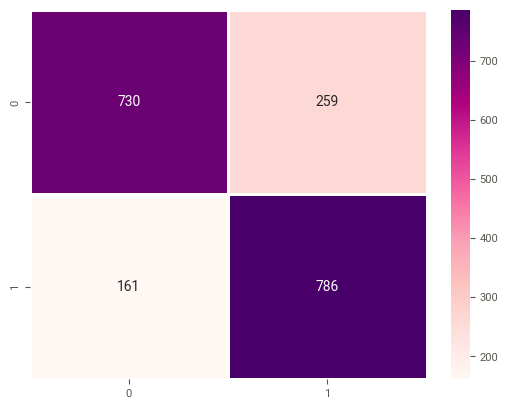

In [316]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(oslr_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.2 Decision Tree

In [317]:
# Initializing the model
dt_clf = DecisionTreeClassifier()
os_dt_model = dt_clf.fit(X_train, y_train)

## Feature importances
dt_importance = os_dt_model.feature_importances_
dt_importance = pd.DataFrame(dt_importance, columns = ["score"]).reset_index()
dt_importance["Feature"] = list(X.columns)
dt_importance.drop(columns = ["index"], inplace = True)
dt_importance.sort_values(by = "score", ascending = False, ignore_index=True, inplace = True)

## Plotting the feature importances
fig = px.bar(dt_importance, x = "Feature", y = "score")
fig.show()

In [318]:
# Making predictions
oversampled_dt_pred = dt_model.predict(X_test)

# Evaluating the model
oversampled_dt_report = classification_report(y_test, oversampled_dt_pred)
print(oversampled_dt_report)

              precision    recall  f1-score   support

           0       0.90      0.97      0.93       989
           1       0.96      0.88      0.92       947

    accuracy                           0.93      1936
   macro avg       0.93      0.93      0.93      1936
weighted avg       0.93      0.93      0.93      1936



In [319]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, oversampled_dt_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.94561


In [320]:
# Defining the Confusion Matrix
os_dt_conf_mat = confusion_matrix(y_test, oversampled_dt_pred)
os_dt_conf_mat = pd.DataFrame(os_dt_conf_mat).reset_index(drop = True)
os_dt_conf_mat

,0,1
0,956,33
1,109,838


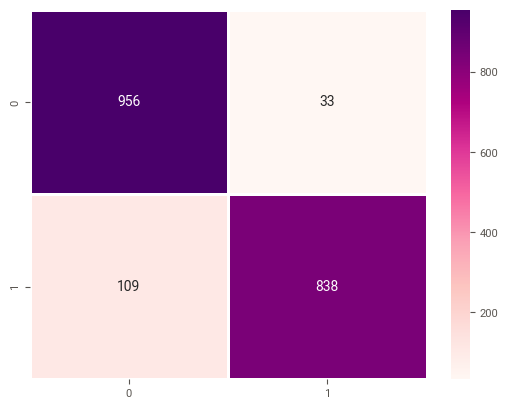

In [321]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(os_dt_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.3 Random Forest

In [322]:
# Random Forests
rf_clf = RandomForestClassifier()
rf_model = rf_clf.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
rf_importance = rf_model.feature_importances_
rf_importance = pd.DataFrame(rf_importance, columns = ["score"]).reset_index()
rf_importance["Feature"] = list(X.columns)
rf_importance.drop(columns = ["index"], inplace = True)
rf_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

## Visualizing the feature importances
fig = px.bar(rf_importance, x = "Feature", y = "score")
fig.show()

In [323]:
# Making predictions
oversampled_rf_pred = rf_model.predict(X_test)

# Evaluating the model
oversampled_rf_report = classification_report(y_test, oversampled_rf_pred)
print(oversampled_rf_report)

              precision    recall  f1-score   support

           0       0.97      0.84      0.90       989
           1       0.85      0.98      0.91       947

    accuracy                           0.91      1936
   macro avg       0.91      0.91      0.91      1936
weighted avg       0.91      0.91      0.91      1936



In [324]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, oversampled_rf_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.87450


In [325]:
# Defining the Confusion Matrix
os_rf_conf_mat = confusion_matrix(y_test, oversampled_rf_pred)
os_rf_conf_mat = pd.DataFrame(os_rf_conf_mat).reset_index(drop = True)
os_rf_conf_mat

,0,1
0,829,160
1,23,924


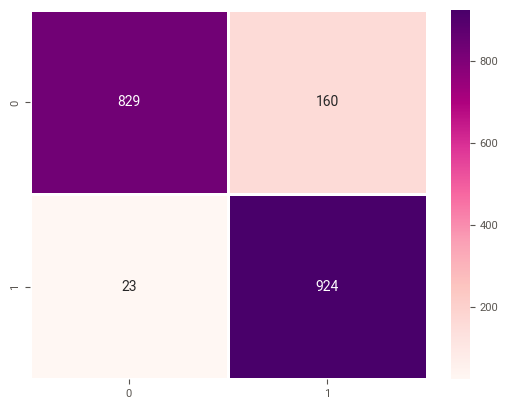

In [326]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(os_rf_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.4 XGBoost

In [ ]:
# Fitting model to the training data
xgb_clf = XGBClassifier()
xgb_model = xgb_clf.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
xgb_importance = xgb_model.feature_importances_
xgb_importance = pd.DataFrame(xgb_importance, columns = ["score"]).reset_index()
xgb_importance["Feature"] = list(X.columns)
xgb_importance.drop(columns = ["index"], inplace = True)
xgb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

## Visualizing the feature importances
fig = px.bar(xgb_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making predictions
oversampled_xgb_pred = xgb_model.predict(X_test)

# Evaluating the model
oversampled_xgb_report = classification_report(y_test, oversampled_xgb_pred)
print(oversampled_xgb_report)

#### 6.1.5 CatBoost

In [ ]:
# Initializing CatBoostClassifier
oversampled_catb_clf = CatBoostClassifier(metric_period= 100)

# Fitting it to the training data
oversampled_catb_model = oversampled_catb_clf.fit(X_train, y_train)

# Feature Importance of the Model
oversampled_catb_importance = oversampled_catb_model.feature_importances_
oversampled_catb_importance = pd.DataFrame(oversampled_catb_importance, columns = ["score"]).reset_index()
oversampled_catb_importance["Feature"] = list(X.columns)
oversampled_catb_importance.drop(columns = ["index"], inplace = True)
oversampled_catb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(oversampled_catb_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making the predictions
oversampled_catb_pred = oversampled_catb_model.predict(X_test)

# Evaluating the model
oversampled_catb_report = classification_report(y_test, oversampled_catb_pred, target_names= ["Stayed", "Churned"])
print(oversampled_catb_report)

#### 6.1.6 LightGBM

In [ ]:
# Initializing LightGBM Classifier
oversampled_lgb_clf = lgb.LGBMClassifier()

# Fitting it to the training data
oversampled_lgb_model = oversampled_lgb_clf.fit(X_train, y_train)

# Feature Importance of the Model
oversampled_lgb_importance = oversampled_lgb_model.feature_importances_
oversampled_lgb_importance = pd.DataFrame(oversampled_lgb_importance, columns = ["score"]).reset_index()
oversampled_lgb_importance["Feature"] = list(X.columns)
oversampled_lgb_importance.drop(columns = ["index"], inplace = True)
oversampled_lgb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(oversampled_lgb_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making the predictions
oversampled_lgb_pred = oversampled_lgb_model.predict(X_test)

# Evaluating the model
oversampled_lgb_report = classification_report(y_test, oversampled_lgb_pred, target_names= ["Stayed", "Churned"])
print(oversampled_lgb_report)

### 6.2 Undersampling

In [ ]:
train_data.head()

In [ ]:
# Undersampling the churned class and combining the "balanced" DataFrame
churn_undersampled = not_churned.sample(count_churned)
df_undersampled = pd.concat([churn_undersampled, churned])

print('Random under-sampling:')
print(df_undersampled["Churn"].value_counts())

In [ ]:
# Defining the target & predictor variables
X = df_undersampled.drop(columns = ["Churn"])
y = df_undersampled["Churn"]

# Splitting the dataframe
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 24)

#### 6.2.1 Logistic Regression

In [ ]:
# Logistic Regression
log_reg = LogisticRegression()
log_reg_model = log_reg.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
log_reg_importance = log_reg_model.coef_[0]
log_reg_importance = pd.DataFrame(log_reg_importance, index = X.columns)
log_reg_importance.reset_index(inplace = True)
log_reg_importance.rename(columns = {"index": "Feature", 0:"Score"}, inplace = True)
log_reg_importance.sort_values(by = "Score", ascending = False, inplace = True)
log_reg_importance

fig = px.bar(log_reg_importance, x = "Feature", y = "Score")
fig.show()

In [ ]:
# Making predictions
undersampled_log_reg_pred = log_reg_model.predict(X_test)

# Evaluating the model
undersampled_log_reg_report = classification_report(y_test, undersampled_log_reg_pred)
print(undersampled_log_reg_report)

#### 6.2.2 Decision Tree

In [ ]:
# Decision Tree
dt_clf = DecisionTreeClassifier()
dt_model = dt_clf.fit(X_train, y_train)

## Feature importances
dt_importance = dt_model.feature_importances_
dt_importance = pd.DataFrame(dt_importance, columns = ["score"]).reset_index()
dt_importance["Feature"] = list(X.columns)
dt_importance.drop(columns = ["index"], inplace = True)
dt_importance.sort_values(by = "score", ascending = False, ignore_index=True, inplace = True)

## Plotting the feature importances
fig = px.bar(dt_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making predictions
undersampled_dt_pred = dt_model.predict(X_test)

# Evaluating the model
undersampled_dt_report = classification_report(y_test, undersampled_dt_pred)
print(undersampled_dt_report)

#### 6.2.3 Random Forest

In [ ]:
# Random Forests
rf_clf = RandomForestClassifier()
rf_model = rf_clf.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
rf_importance = rf_model.feature_importances_
rf_importance = pd.DataFrame(rf_importance, columns = ["score"]).reset_index()
rf_importance["Feature"] = list(X.columns)
rf_importance.drop(columns = ["index"], inplace = True)
rf_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(rf_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making predictions
undersampled_rf_pred = rf_model.predict(X_test)

# Evaluating the model
undersampled_rf_report = classification_report(y_test, undersampled_rf_pred)
print(undersampled_rf_report)

#### 6.2.4 XGBoost

In [ ]:
# fitting model to the training data
xgb_clf = XGBClassifier()
xgb_model = xgb_clf.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
xgb_importance = xgb_model.feature_importances_
xgb_importance = pd.DataFrame(xgb_importance, columns = ["score"]).reset_index()
xgb_importance["Feature"] = list(X.columns)
xgb_importance.drop(columns = ["index"], inplace = True)
xgb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(xgb_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making the predictions
undersampled_xgb_pred = xgb_model.predict(X_test)

# Evaluating the model
undersampled_xgb_report = classification_report(y_test, undersampled_xgb_pred)
print(undersampled_xgb_report)

#### 6.2.5 CatBoost

In [ ]:
# Initializing CatBoostClassifier
undersampled_catb_clf = CatBoostClassifier(metric_period= 100)

# Fitting it to the training data
undersampled_catb_model = undersampled_catb_clf.fit(X_train, y_train)

# Feature Importance of the Model
undersampled_catb_importance = undersampled_catb_model.feature_importances_
undersampled_catb_importance = pd.DataFrame(undersampled_catb_importance, columns = ["score"]).reset_index()
undersampled_catb_importance["Feature"] = list(X.columns)
undersampled_catb_importance.drop(columns = ["index"], inplace = True)
undersampled_catb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(undersampled_catb_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making the predictions
undersampled_catb_pred = undersampled_catb_model.predict(X_test)

# Evaluating the model
undersampled_catb_report = classification_report(y_test, undersampled_catb_pred, target_names= ["Stayed", "Churned"])
print(undersampled_catb_report)

#### 6.2.6 LightGBM

In [ ]:
# Initializing LightGBM Classifier
undersampled_lgb_clf = lgb.LGBMClassifier()

# Fitting it to the training data
undersampled_lgb_model = undersampled_lgb_clf.fit(X_train, y_train)

# Feature Importance of the Model
undersampled_lgb_importance = undersampled_lgb_model.feature_importances_
undersampled_lgb_importance = pd.DataFrame(undersampled_lgb_importance, columns = ["score"]).reset_index()
undersampled_lgb_importance["Feature"] = list(X.columns)
undersampled_lgb_importance.drop(columns = ["index"], inplace = True)
undersampled_lgb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(undersampled_lgb_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making the predictions
undersampled_lgb_pred = undersampled_lgb_model.predict(X_test)

# Evaluating the model
undersampled_lgb_report = classification_report(y_test, undersampled_lgb_pred, target_names= ["Stayed", "Churned"])
print(undersampled_lgb_report)

### 6.3 SMOTE

In [327]:
# Creating a copy of the the training dataframe for the SMOTE
smote_data = train_data.copy()
X = smote_data.drop(columns = ["Churn"])
y = smote_data["Churn"]

In [328]:
# Resampling the dataframe using SMOTE
smote = SMOTE(sampling_strategy='minority')
X_sm, y_sm = smote.fit_resample(X, y)
y_sm.value_counts()

0    3872
1    3872
Name: Churn, dtype: int64

In [329]:
# Splitting the dataframe
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size = 0.25, random_state = 24 , stratify=y_sm)
y_train.value_counts()

1    2904
0    2904
Name: Churn, dtype: int64

#### 6.3.1 Logistic Regression

In [330]:
# Logistic Regression
log_reg = LogisticRegression()
log_reg_model = log_reg.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
log_reg_importance = log_reg_model.coef_[0]
log_reg_importance = pd.DataFrame(log_reg_importance, index = X.columns)
log_reg_importance.reset_index(inplace = True)
log_reg_importance.rename(columns = {"index": "Feature", 0:"Score"}, inplace = True)
log_reg_importance.sort_values(by = "Score", ascending = False, inplace = True)
log_reg_importance

fig = px.bar(log_reg_importance, x = "Feature", y = "Score")
fig.show()

In [331]:
# Making predictions
smote_log_reg_pred = log_reg_model.predict(X_test)

# Evaluating the predictions
log_report = classification_report(y_test, smote_log_reg_pred)
print(log_report)

              precision    recall  f1-score   support

           0       0.85      0.82      0.84       968
           1       0.83      0.86      0.84       968

    accuracy                           0.84      1936
   macro avg       0.84      0.84      0.84      1936
weighted avg       0.84      0.84      0.84      1936



In [332]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, smote_log_reg_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.83535


In [333]:
# Defining the Confusion Matrix
smote_lr_conf_mat = confusion_matrix(y_test, smote_log_reg_pred)
smote_lr_conf_mat = pd.DataFrame(smote_lr_conf_mat).reset_index(drop = True)
smote_lr_conf_mat

,0,1
0,798,170
1,138,830


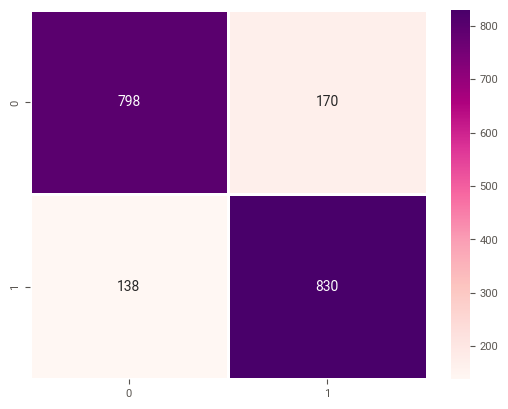

In [334]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(smote_lr_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.2 Decision Tree

In [ ]:
# Decision Tree
dt_clf = DecisionTreeClassifier()
dt_model = dt_clf.fit(X_train, y_train)

## Feature importances
dt_importance = dt_model.feature_importances_
dt_importance = pd.DataFrame(dt_importance, columns = ["score"]).reset_index()
dt_importance["Feature"] = list(X.columns)
dt_importance.drop(columns = ["index"], inplace = True)
dt_importance.sort_values(by = "score", ascending = False, ignore_index=True, inplace = True)

## Plotting the feature importances
fig = px.bar(dt_importance, x = "Feature", y = "score")
fig.show()

In [ ]:
# Making predictions
smote_dt_pred = dt_model.predict(X_test)

# Evaluating the predictions
smote_dt_report = classification_report(y_test, smote_dt_pred)
print(smote_dt_report)

#### 6.3.3 Random Forest

In [335]:
# Random Forests
rf_clf = RandomForestClassifier()
sm_rf_model = rf_clf.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
sm_rf_importance = sm_rf_model.feature_importances_
sm_rf_importance = pd.DataFrame(sm_rf_importance, columns = ["score"]).reset_index()
sm_rf_importance["Feature"] = list(X.columns)
sm_rf_importance.drop(columns = ["index"], inplace = True)
sm_rf_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(sm_rf_importance, x = "Feature", y = "score")
fig.show()

In [336]:
# Making predictions
smote_rf_pred = rf_model.predict(X_test)

smote_rf_report = classification_report(y_test, smote_rf_pred)
print(smote_rf_report)

              precision    recall  f1-score   support

           0       0.88      0.98      0.93       968
           1       0.97      0.87      0.92       968

    accuracy                           0.92      1936
   macro avg       0.93      0.92      0.92      1936
weighted avg       0.93      0.92      0.92      1936



In [337]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, smote_rf_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.95163


In [338]:
# Defining the Confusion Matrix
smote_rf_conf_mat = confusion_matrix(y_test, smote_rf_pred)
smote_rf_conf_mat = pd.DataFrame(smote_rf_conf_mat).reset_index(drop = True)
smote_rf_conf_mat

,0,1
0,946,22
1,126,842


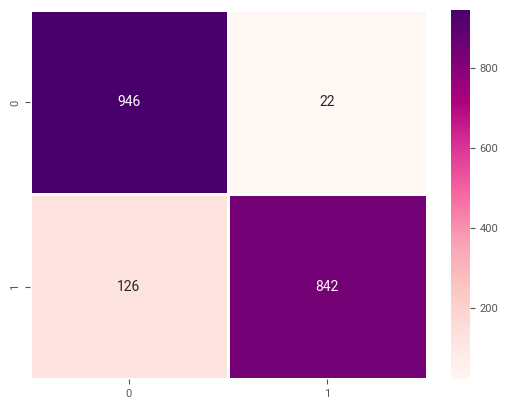

In [339]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(smote_rf_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.4 XGBoost

In [340]:
# fitting model to the training data
xgb_clf = XGBClassifier()
smote_xgb_model = xgb_clf.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
smote_xgb_importance = smote_xgb_model.feature_importances_
smote_xgb_importance = pd.DataFrame(smote_xgb_importance, columns = ["score"]).reset_index()
smote_xgb_importance["Feature"] = list(X.columns)
smote_xgb_importance.drop(columns = ["index"], inplace = True)
smote_xgb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(smote_xgb_importance, x = "Feature", y = "score")
fig.show()

In [341]:
# Making the predictions
smote_xgb_pred = smote_xgb_model.predict(X_test)

# Evaluating the model
smote_xgb_report = classification_report(y_test, smote_xgb_pred)
print(smote_xgb_report)

              precision    recall  f1-score   support

           0       0.85      0.83      0.84       968
           1       0.83      0.85      0.84       968

    accuracy                           0.84      1936
   macro avg       0.84      0.84      0.84      1936
weighted avg       0.84      0.84      0.84      1936



In [342]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, smote_xgb_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.83704


In [343]:
# Defining the Confusion Matrix
smote_xgb_conf_mat = confusion_matrix(y_test, smote_xgb_pred)
smote_xgb_conf_mat = pd.DataFrame(smote_xgb_conf_mat).reset_index(drop = True)
smote_xgb_conf_mat

,0,1
0,802,166
1,141,827


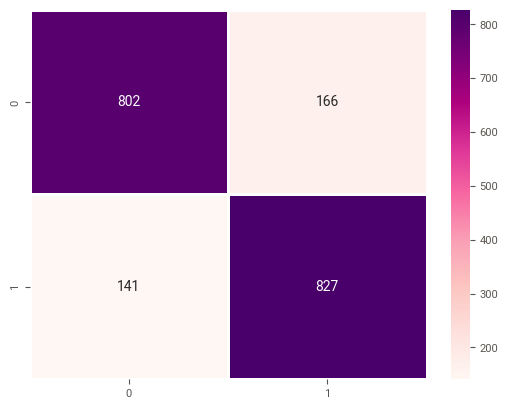

In [344]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(smote_xgb_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.5 CatBoost

In [345]:
# Initializing CatBoostClassifier
catb_clf = CatBoostClassifier(metric_period= 100)

# Fitting it to the training data
smote_catb_model = catb_clf.fit(X_train, y_train)

# Feature Importance of the Model
smote_catb_importance = smote_catb_model.feature_importances_
smote_catb_importance = pd.DataFrame(smote_catb_importance, columns = ["score"]).reset_index()
smote_catb_importance["Feature"] = list(X.columns)
smote_catb_importance.drop(columns = ["index"], inplace = True)
smote_catb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(smote_catb_importance, x = "Feature", y = "score")
fig.show()

Learning rate set to 0.021836
0:	learn: 0.6824175	total: 4.43ms	remaining: 4.42s
100:	learn: 0.4174220	total: 389ms	remaining: 3.46s
200:	learn: 0.3687102	total: 769ms	remaining: 3.06s
300:	learn: 0.3419287	total: 1.19s	remaining: 2.75s
400:	learn: 0.3227196	total: 1.58s	remaining: 2.36s
500:	learn: 0.3047741	total: 1.96s	remaining: 1.95s
600:	learn: 0.2891923	total: 2.36s	remaining: 1.57s
700:	learn: 0.2756372	total: 2.8s	remaining: 1.2s
800:	learn: 0.2642879	total: 3.24s	remaining: 804ms
900:	learn: 0.2536278	total: 3.63s	remaining: 399ms
999:	learn: 0.2437463	total: 4.01s	remaining: 0us


In [346]:
# Making the predictions
smote_catb_pred = smote_catb_model.predict(X_test)

# Evaluating the model
smote_catb_report = classification_report(y_test, smote_catb_pred, target_names= ["Stayed", "Churned"])
print(smote_catb_report)

              precision    recall  f1-score   support

      Stayed       0.86      0.84      0.85       968
     Churned       0.85      0.87      0.86       968

    accuracy                           0.85      1936
   macro avg       0.85      0.85      0.85      1936
weighted avg       0.85      0.85      0.85      1936



In [348]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, smote_catb_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.84988


In [349]:
# Defining the Confusion Matrix
smote_catb_conf_mat = confusion_matrix(y_test, smote_catb_pred)
smote_catb_conf_mat = pd.DataFrame(smote_catb_conf_mat).reset_index(drop = True)
smote_catb_conf_mat

,0,1
0,815,153
1,129,839


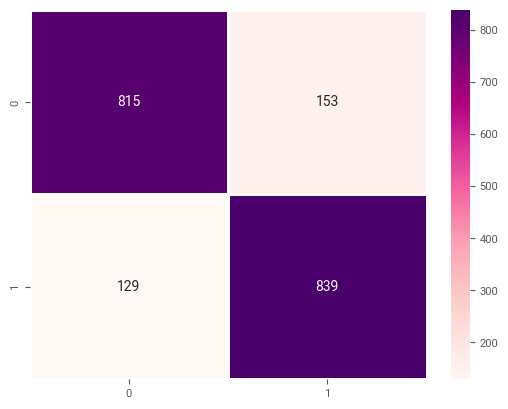

In [350]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(smote_catb_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.6 LightGBM

In [351]:
# Initializing LightGBM Classifier
smote_lgb_clf = lgb.LGBMClassifier()

# Fitting it to the training data
smote_lgb_model = smote_lgb_clf.fit(X_train, y_train)

# Feature Importance of the Model
smote_lgb_importance = smote_lgb_model.feature_importances_
smote_lgb_importance = pd.DataFrame(smote_lgb_importance, columns = ["score"]).reset_index()
smote_lgb_importance["Feature"] = list(X.columns)
smote_lgb_importance.drop(columns = ["index"], inplace = True)
smote_lgb_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

fig = px.bar(smote_lgb_importance, x = "Feature", y = "score")
fig.show()

In [352]:
# Making the predictions
smote_lgb_pred = smote_lgb_model.predict(X_test)

# Evaluating the model
smote_lgb_report = classification_report(y_test, smote_lgb_pred, target_names= ["Stayed", "Churned"])
print(smote_lgb_report)

              precision    recall  f1-score   support

      Stayed       0.85      0.83      0.84       968
     Churned       0.84      0.85      0.84       968

    accuracy                           0.84      1936
   macro avg       0.84      0.84      0.84      1936
weighted avg       0.84      0.84      0.84      1936



In [353]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, smote_lgb_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.83908


In [354]:
# Defining the Confusion Matrix
smote_lgb_conf_mat = confusion_matrix(y_test, smote_lgb_pred)
smote_lgb_conf_mat = pd.DataFrame(smote_lgb_conf_mat).reset_index(drop = True)
smote_lgb_conf_mat

,0,1
0,805,163
1,141,827


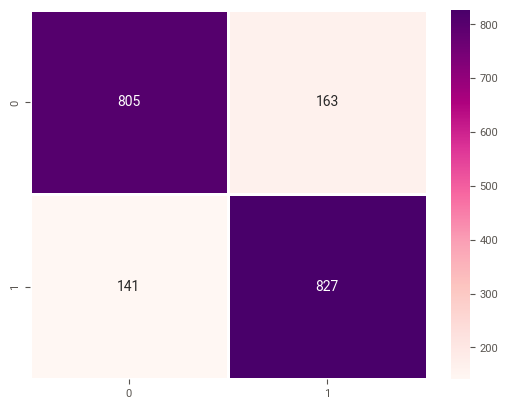

In [355]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(smote_lgb_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

### 6.4 Standalone tree-based models

In [356]:
# Defining the target & predictor variables
X = train_data.drop(columns = ["Churn"])
y = train_data["Churn"]

# Splitting the dataframe into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 24, stratify = y)

#### 6.4.1 Decision Tree

In [357]:
# Decision Tree
dt_clf = DecisionTreeClassifier()
dt_model = dt_clf.fit(X_train, y_train)

## Feature importances
dt_importance = dt_model.feature_importances_
dt_importance = pd.DataFrame(dt_importance, columns = ["score"]).reset_index()
dt_importance["Feature"] = list(X.columns)
dt_importance.drop(columns = ["index"], inplace = True)
dt_importance.sort_values(by = "score", ascending = False, ignore_index=True, inplace = True)

## Plotting the feature importances
fig = px.bar(dt_importance, x = "Feature", y = "score")
fig.show()

In [358]:
# Making predictions
dt_pred = dt_model.predict(X_test)

# Evaluating the model
dt_report = classification_report(y_test, dt_pred, target_names= ["Stayed", "Churned"])
print(dt_report)

              precision    recall  f1-score   support

      Stayed       0.82      0.78      0.80       968
     Churned       0.46      0.51      0.49       351

    accuracy                           0.71      1319
   macro avg       0.64      0.65      0.64      1319
weighted avg       0.72      0.71      0.72      1319



In [359]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, dt_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.47096


In [360]:
# Defining the Confusion Matrix
dt_conf_mat = confusion_matrix(y_test, dt_pred)
dt_conf_mat = pd.DataFrame(dt_conf_mat).reset_index(drop = True)
dt_conf_mat

,0,1
0,758,210
1,171,180


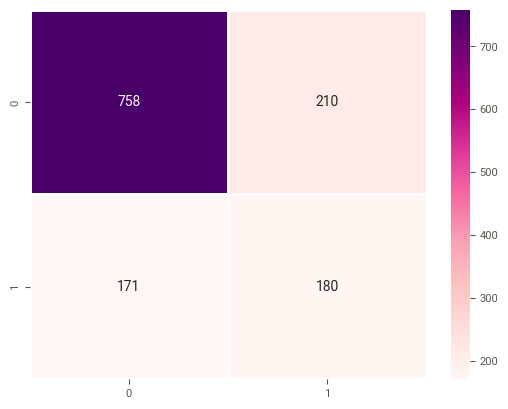

In [361]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(dt_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.4.2 Random Forest

In [362]:
# Random Forests
rf_clf = RandomForestClassifier()
rf_model = rf_clf.fit(X_train, y_train)

## Feature Importance of the Random Forest Model
rf_importance = rf_model.feature_importances_
rf_importance = pd.DataFrame(rf_importance, columns = ["score"]).reset_index()
rf_importance["Feature"] = list(X.columns)
rf_importance.drop(columns = ["index"], inplace = True)
rf_importance.sort_values(by = "score", ascending = False, ignore_index = True, inplace = True)

## Visualizing the feature importances
fig = px.bar(rf_importance, x = "Feature", y = "score")
fig.show()

In [363]:
# Making predictions
rf_pred = rf_model.predict(X_test)

# Evaluating the model
rf_report = classification_report(y_test, rf_pred, target_names= ["Stayed", "Churned"])
print(rf_report)

              precision    recall  f1-score   support

      Stayed       0.83      0.91      0.87       968
     Churned       0.65      0.48      0.55       351

    accuracy                           0.79      1319
   macro avg       0.74      0.69      0.71      1319
weighted avg       0.78      0.79      0.78      1319



In [364]:
# Calculating the F2 Score
f2_score = fbeta_score(y_test, rf_pred, beta = 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.60738


In [365]:
# Confusion Matrix
rf_conf_mat = confusion_matrix(y_test, rf_pred)
rf_conf_mat = (pd.DataFrame(rf_conf_mat).reset_index(drop = True)).rename(columns = {0: "Stayed",1:"Churned"})
rf_conf_mat

,Stayed,Churned
0,878,90
1,183,168


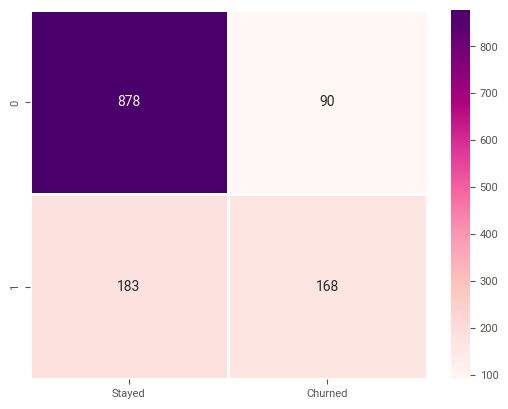

In [366]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(rf_conf_mat, annot= True, linewidth= 1.0, fmt= ".0f", cmap= "RdPu", ax = ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()